# Question 1A

## Import Packages

In [1]:
from torchvision.datasets import ImageFolder
from torchvision.transforms import ToTensor
from torch.utils.data import DataLoader
from torchvision import transforms
from torch.utils.data import Dataset
import torch
import time
import random
import os
import matplotlib.pyplot as plt
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

## Specify Transforms

In [2]:
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(scale=(0.6, 1.0), size=(112,112)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor()
])

eval_transforms = transforms.Compose([
    transforms.Resize(size=(112,112)),
    transforms.ToTensor()
])



## Load in Dataset

Code is initally loaded using the ImageFolder Class, which replaces the dataset class. This class requires the root folder (In this case the seg_train folder) and creates classes based on the name of the folder. The transforms can also be applied here. Current transforms are from lab 4.

In [3]:
train_dataset = ImageFolder(root='datasets/Intel_Classification_Dataset/seg_train',transform=train_transforms)
print("Train: {} examples".format(len(train_dataset)))

eval_dataset= ImageFolder(root='datasets/Intel_Classification_Dataset/seg_test',transform=eval_transforms)
print("Eval: {} examples".format(len(eval_dataset)))



Train: 14034 examples
Eval: 3000 examples


Once passed into the class, the dataset can be passed using the dataloader class like previous. Current batch size is from lab 4

In [9]:
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=64, shuffle=True)
eval_loader=torch.utils.data.DataLoader(dataset=eval_dataset, batch_size=len(eval_dataset), shuffle=True)
print("Train: {} batches".format(len(train_loader)))
print("Valid: {} batches".format(len(eval_loader))) 

Train: 220 batches
Valid: 1 batches


## Show 10 random Images to verify labels

The code gets the class names randomly picks 10 images to display.

### Training Dataset

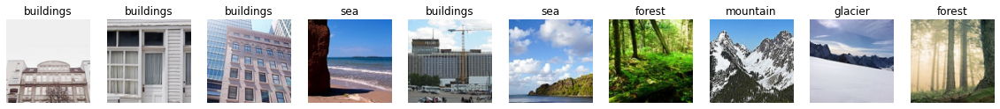

In [4]:
# Get the class names
class_names = train_dataset.classes

# Shuffle the indices of the dataset
indices = list(range(len(train_dataset)))
random.shuffle(indices)

# Define the number of images to show
num_images = 10

# Create a figure and axis objects using matplotlib
fig, axs = plt.subplots(1, num_images, figsize=(20, 20))

# Loop over the random indices and plot the images
for i in range(num_images):
    index = indices[i]
    img, label = train_dataset[index]
    img = img.permute(1, 2, 0)
    axs[i].imshow(img)
    axs[i].set_title(class_names[label])
    axs[i].axis("off")

# Show the plot
plt.show()


### Eval Dataset

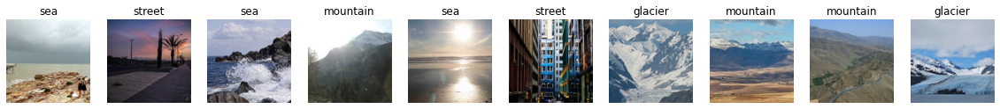

In [5]:
# Get the class names
class_names = eval_dataset.classes

# Shuffle the indices of the dataset
indices = list(range(len(eval_dataset)))
random.shuffle(indices)

# Define the number of images to show
num_images = 10

# Create a figure and axis objects using matplotlib
fig, axs = plt.subplots(1, num_images, figsize=(20, 20))

# Loop over the random indices and plot the images
for i in range(num_images):
    index = indices[i]
    img, label = eval_dataset[index]
    img = img.permute(1, 2, 0)
    axs[i].imshow(img)
    axs[i].set_title(class_names[label])
    axs[i].axis("off")

# Show the plot
plt.show()


### Define the CNN model to be used

#### First model

In [33]:
class Model(torch.nn.Module):
    def __init__(self):
        super(Model, self).__init__()
        self.conv_layer_1 = torch.nn.Sequential(
            torch.nn.Conv2d(3, 16, kernel_size=3, padding=1),
            torch.nn.BatchNorm2d(16),
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(2)
        )
        self.conv_layer_2 = torch.nn.Sequential(
            torch.nn.Conv2d(16, 32, kernel_size=3, padding=1),
            torch.nn.BatchNorm2d(32),
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(2)
        )
        self.conv_layer_3 = torch.nn.Sequential(
            torch.nn.Conv2d(32, 64, kernel_size=3, padding=1),
            torch.nn.BatchNorm2d(64),
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(2)
        )
        self.conv_layer_4 = torch.nn.Sequential(
            torch.nn.Conv2d(64, 128, kernel_size=3, padding=1),
            torch.nn.BatchNorm2d(128),
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(2)
        )
        self.fc_layer_1 = torch.nn.Sequential(
            torch.nn.Linear(7*7*128, 128),
            torch.nn.Dropout(),
            torch.nn.ReLU()
        )
        self.fc_layer_2 = torch.nn.Linear(128, 6)

    def forward(self, x):
        x = self.conv_layer_1(x)
        x = self.conv_layer_2(x)
        x = self.conv_layer_3(x)
        x = self.conv_layer_4(x)
        x = x.view(x.size(0), -1) # Flatten
        x = self.fc_layer_1(x)
        x = self.fc_layer_2(x)
        return x

#### Second model

In [26]:
class Model(torch.nn.Module):
    def __init__(self):
        super(Model, self).__init__()
        self.conv_layer_1 = torch.nn.Sequential(
            torch.nn.Conv2d(3, 16, kernel_size=3, padding=1),
            torch.nn.BatchNorm2d(16),
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(2)
        )
        self.conv_layer_2 = torch.nn.Sequential(
            torch.nn.Conv2d(16, 32, kernel_size=3, padding=1),
            torch.nn.BatchNorm2d(32),
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(2)
        )
        self.conv_layer_3 = torch.nn.Sequential(
            torch.nn.Conv2d(32, 64, kernel_size=3, padding=1),
            torch.nn.BatchNorm2d(64),
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(2)
        )
        self.fc_layer_1 = torch.nn.Sequential(
            torch.nn.Linear(12544, 64),
            torch.nn.Dropout(),
            torch.nn.ReLU()
        )
        self.fc_layer_2 = torch.nn.Linear(64, 6)

    def forward(self, x):
        x = self.conv_layer_1(x)
        x = self.conv_layer_2(x)
        x = self.conv_layer_3(x)
        x = x.view(x.size(0), -1) # Flatten
        x = self.fc_layer_1(x)
        x = self.fc_layer_2(x)
        return x

### Define optimiser and loss function

In [34]:
# Create an object from the model
model = Model()

# Set loss function and optimizer
optimizer = torch.optim.Adam(params=model.parameters(), lr=0.001)
loss_fn = torch.nn.CrossEntropyLoss()

### Train the model

Epoch: 1, train accuracy: 58.57%, train loss: 1.1016
235.37136888504028 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


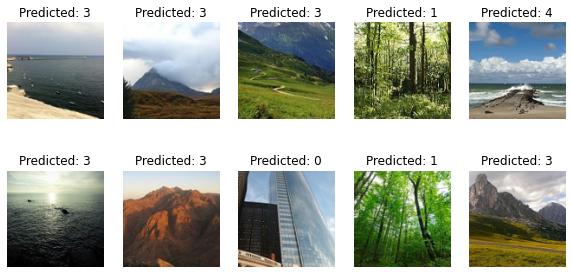

Epoch: 2, train accuracy: 69.63%, train loss: 0.8395
220.12434315681458 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


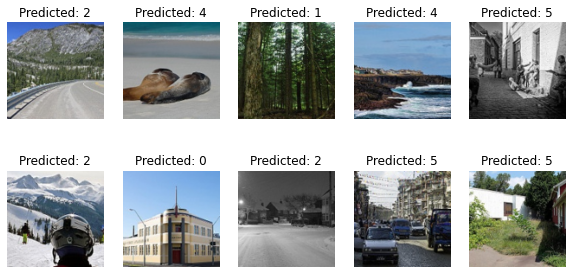

Epoch: 3, train accuracy: 72.69%, train loss: 0.7573
233.7100691795349 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


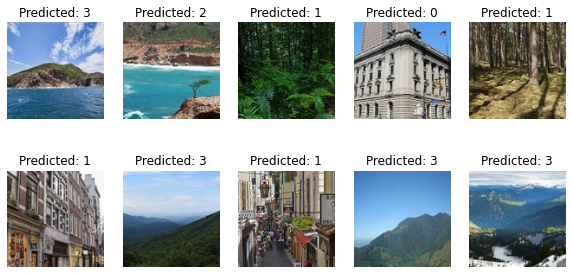

Epoch: 4, train accuracy: 74.93%, train loss: 0.6973
246.86408591270447 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


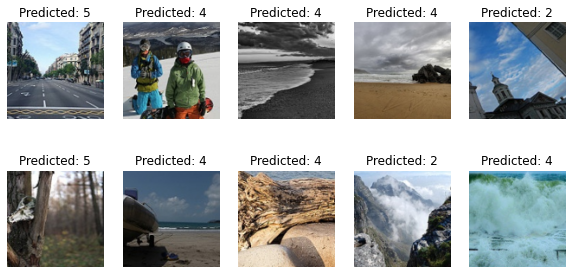

Epoch: 5, train accuracy: 77.13%, train loss: 0.6530
219.57574248313904 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


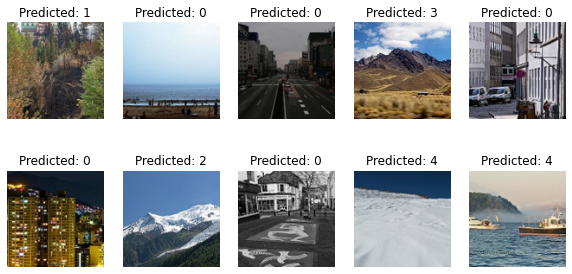

Epoch: 6, train accuracy: 77.97%, train loss: 0.6220
221.79491662979126 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


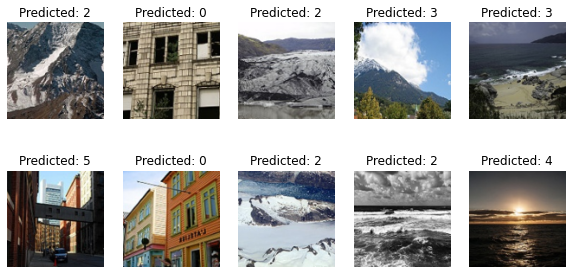

Epoch: 7, train accuracy: 79.12%, train loss: 0.5927
221.6097390651703 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


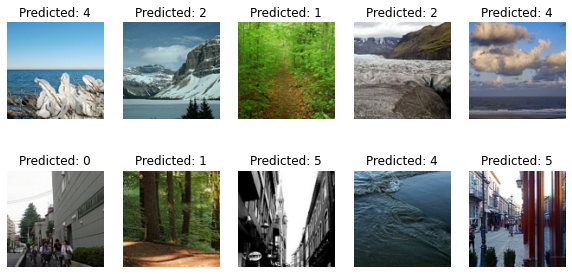

Epoch: 8, train accuracy: 79.55%, train loss: 0.5748
223.67665934562683 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


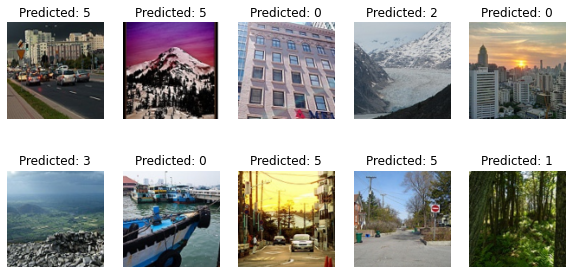

Epoch: 9, train accuracy: 81.07%, train loss: 0.5448
220.41114115715027 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


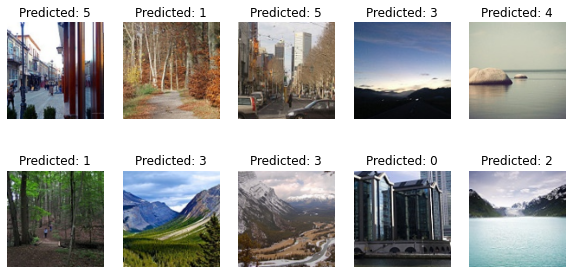

Epoch: 10, train accuracy: 81.18%, train loss: 0.5323
217.41653084754944 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


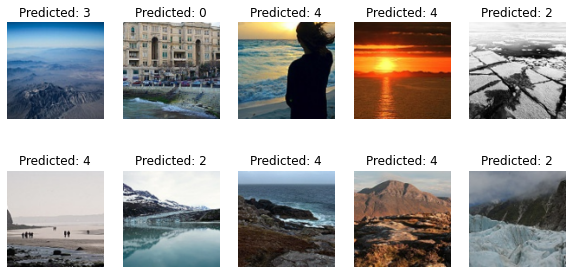

Epoch: 11, train accuracy: 82.00%, train loss: 0.5169
221.78104543685913 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


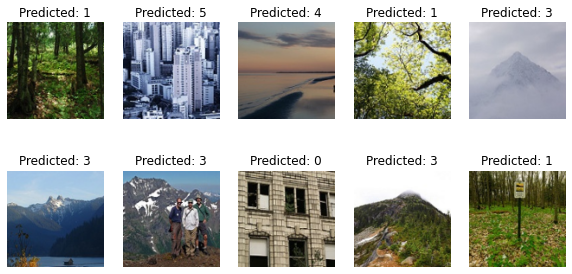

Epoch: 12, train accuracy: 82.78%, train loss: 0.5040
224.2460904121399 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


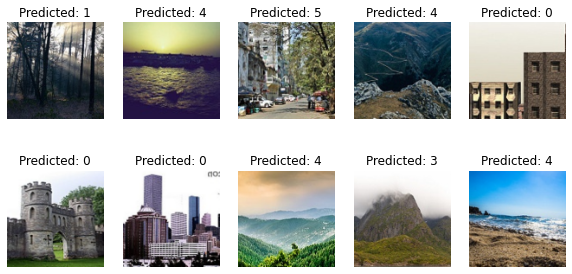

Epoch: 13, train accuracy: 83.14%, train loss: 0.4910
220.8673610687256 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


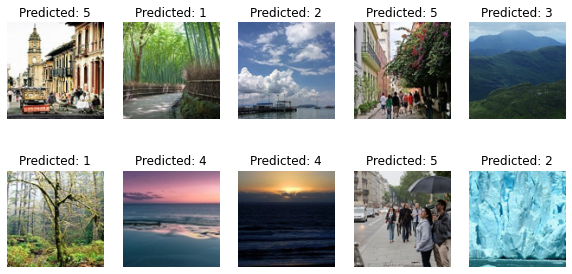

Epoch: 14, train accuracy: 82.90%, train loss: 0.4848
222.74088788032532 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


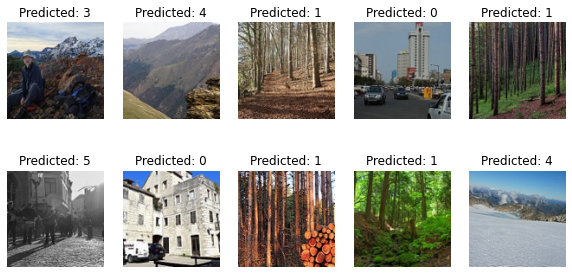

Epoch: 15, train accuracy: 83.40%, train loss: 0.4664
225.23388147354126 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


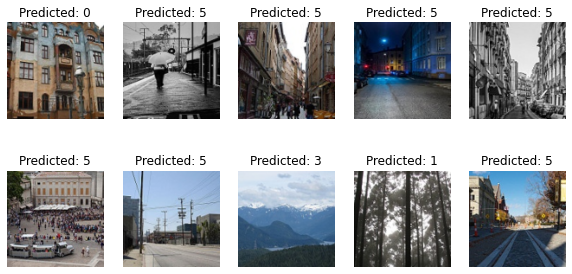

Epoch: 16, train accuracy: 84.09%, train loss: 0.4521
220.77140021324158 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


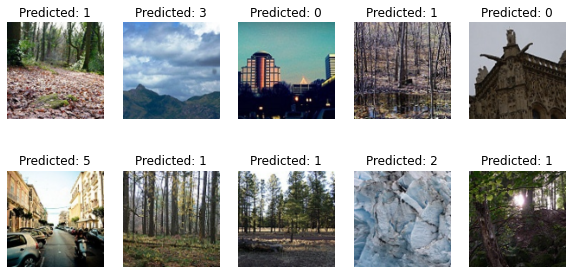

Epoch: 17, train accuracy: 84.48%, train loss: 0.4464
222.09031128883362 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


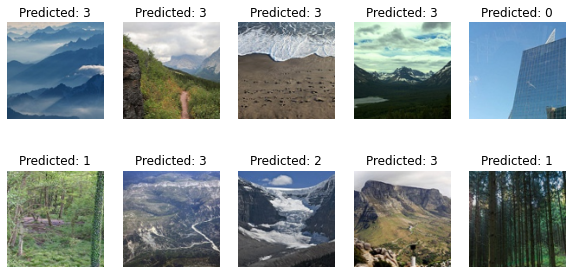

Epoch: 18, train accuracy: 84.90%, train loss: 0.4316
232.79545331001282 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


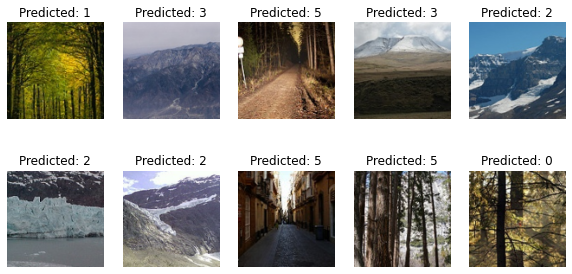

Epoch: 19, train accuracy: 84.90%, train loss: 0.4283
216.12731981277466 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


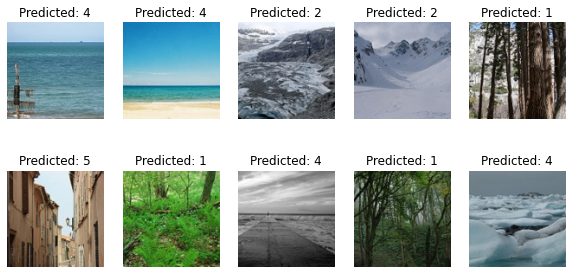

Epoch: 20, train accuracy: 85.03%, train loss: 0.4170
223.29660868644714 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


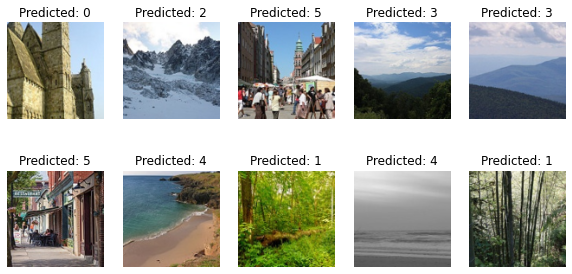

Epoch: 21, train accuracy: 85.66%, train loss: 0.4229
226.24685978889465 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


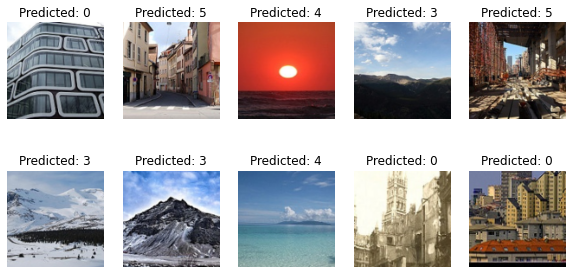

Epoch: 22, train accuracy: 85.42%, train loss: 0.4097
230.8269546031952 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


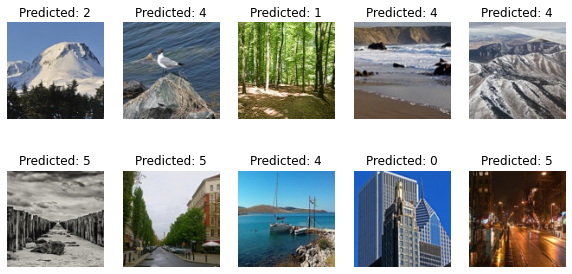

Epoch: 23, train accuracy: 85.66%, train loss: 0.4068
220.4422676563263 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


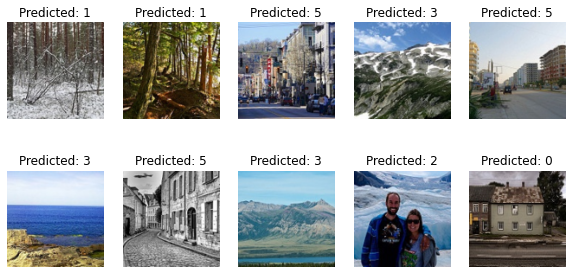

Epoch: 24, train accuracy: 86.20%, train loss: 0.4059
223.4210147857666 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


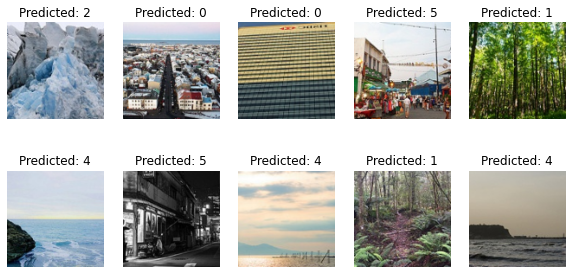

Epoch: 25, train accuracy: 86.61%, train loss: 0.3825
219.2203335762024 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


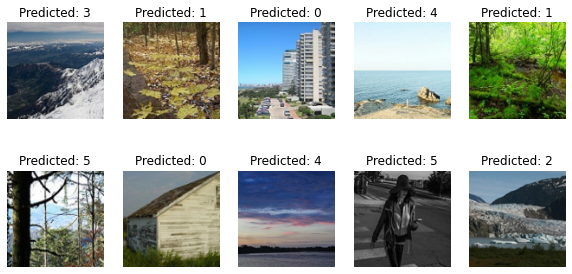

Epoch: 26, train accuracy: 86.91%, train loss: 0.3818
221.00138521194458 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


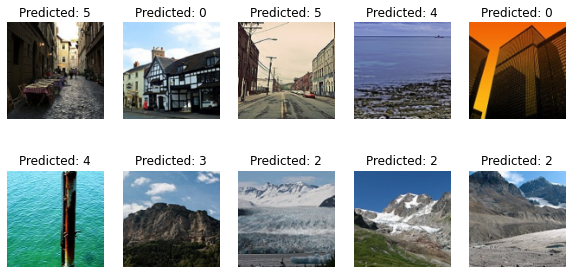

Epoch: 27, train accuracy: 86.84%, train loss: 0.3766
219.192280292511 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


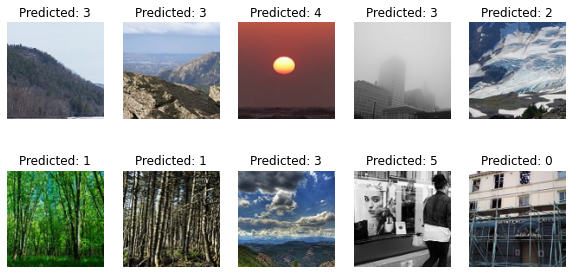

Epoch: 28, train accuracy: 86.95%, train loss: 0.3690
223.0700328350067 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


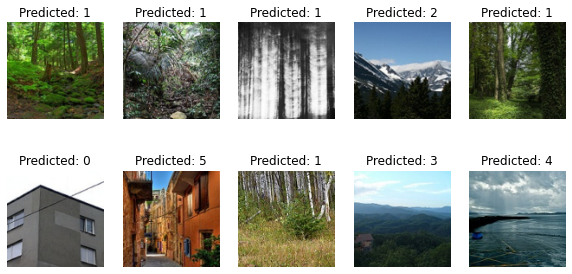

Epoch: 29, train accuracy: 87.16%, train loss: 0.3661
224.54438972473145 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


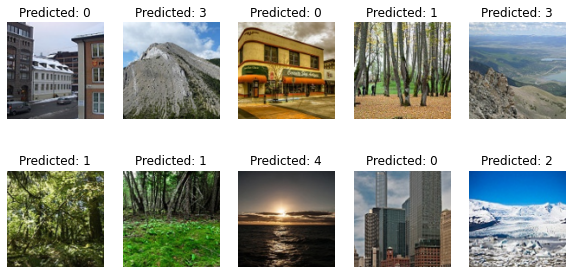

Epoch: 30, train accuracy: 86.89%, train loss: 0.3717
219.34225010871887 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


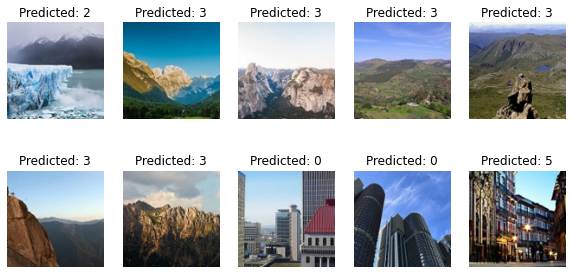

Epoch: 31, train accuracy: 87.65%, train loss: 0.3617
219.87557220458984 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


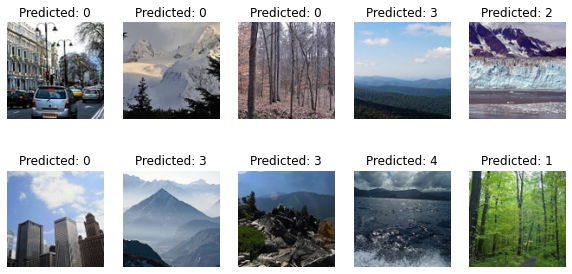

Epoch: 32, train accuracy: 87.69%, train loss: 0.3519
219.61744499206543 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


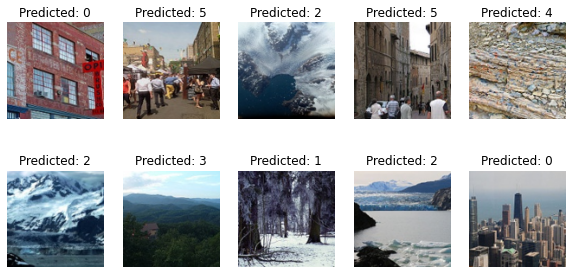

Epoch: 33, train accuracy: 88.32%, train loss: 0.3440
223.83665943145752 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


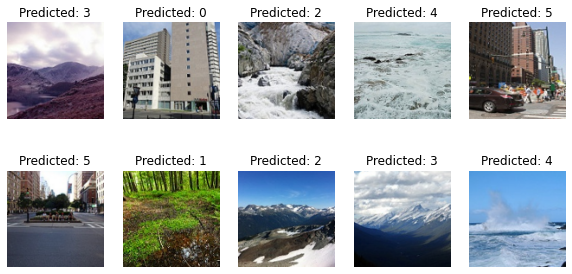

Epoch: 34, train accuracy: 87.60%, train loss: 0.3575
221.86969375610352 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


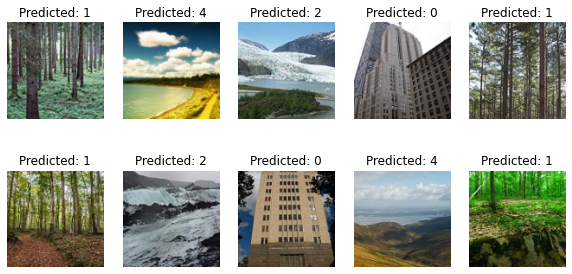

Epoch: 35, train accuracy: 87.80%, train loss: 0.3496
220.28454852104187 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


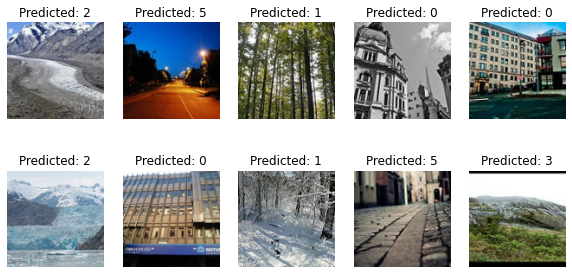

Epoch: 36, train accuracy: 87.84%, train loss: 0.3447
221.82482957839966 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


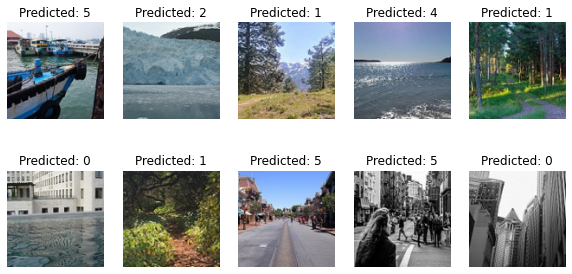

Epoch: 37, train accuracy: 88.07%, train loss: 0.3339
218.2393021583557 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


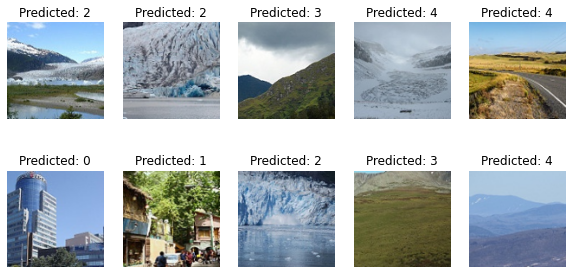

Epoch: 38, train accuracy: 88.38%, train loss: 0.3323
215.86340475082397 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


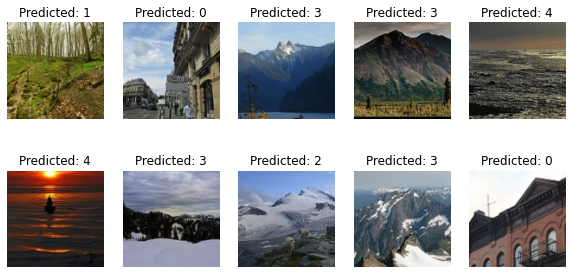

Epoch: 39, train accuracy: 88.65%, train loss: 0.3221
223.51115655899048 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


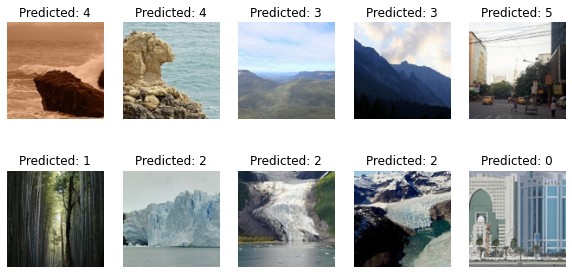

Epoch: 40, train accuracy: 88.85%, train loss: 0.3134
236.41493701934814 seconds
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


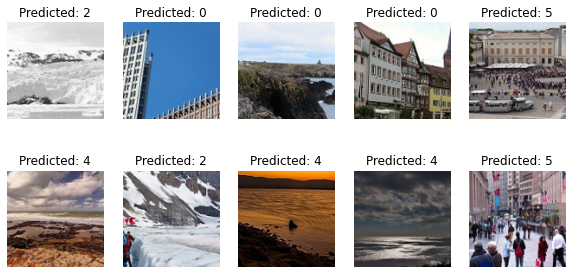

In [35]:
import numpy as np
train_losses=[]
train_accs=[]
# Train for 10 epochs
for epoch in range(40):
    t0=time.time()
    ### Training
    # Track epoch loss and accuracy
    epoch_loss, epoch_accuracy = 0, 0
    # Switch model to training (affects batch norm and dropout)
    model.train()
    # Iterate through batches
    for i, (data, label) in enumerate(train_loader):
        # Reset gradients
        optimizer.zero_grad()
        # Forward pass
        output = model(data)
        loss = loss_fn(output, label)
        # Backward pass
        loss.backward()
        # Adjust weights
        optimizer.step()
        # Compute metrics
        acc = ((output.argmax(dim=1) == label).float().mean())
        epoch_accuracy += acc/len(train_loader)
        epoch_loss += loss/len(train_loader)
    print('Epoch: {}, train accuracy: {:.2f}%, train loss: {:.4f}'.format(epoch+1, epoch_accuracy*100, epoch_loss))
    print('{} seconds'.format(time.time() - t0))
    train_losses.append(epoch_loss.item())
    train_accs.append(epoch_accuracy.item())

       ### Prediction
    print(train_dataset.classes)
    # Switch model to evaluation mode
    model.eval()
    # Get 10 random images from the training set
    indices = torch.randint(0, len(train_dataset), (10,)).tolist()
    data = [train_dataset[i] for i in indices]
    images = torch.stack([d[0] for d in data])
    labels = torch.tensor([d[1] for d in data])

    # Predict the labels for the images
    with torch.no_grad():
        outputs = model(images)
    predicted = torch.argmax(outputs, dim=1)

    fig, axs = plt.subplots(2, 5, figsize=(10, 5))
    for i in range(2):
        for j in range(5):
            index = i * 5 + j
            axs[i, j].imshow(images[index].permute(1, 2, 0))
            axs[i, j].set_title('Predicted: {}'.format(predicted[index]))
            axs[i, j].axis('off')
    plt.show()


### Compute validation accuracy and loss

In [31]:
test_accuracy, test_loss = 0, 0
with torch.no_grad():
    # Iterate through batches
    for data, label in eval_loader:
        # Forward pass
        test_output_i = model(data)
        test_loss_i = loss_fn(test_output_i, label)
        # Compute metrics
        acc = ((test_output_i.argmax(dim=1) == label).float().mean())
        test_accuracy += acc/len(eval_loader)
        test_loss += test_loss_i/len(eval_loader)

print("Test loss: {:.4f}".format(test_loss))
print("Test accuracy: {:.2f}%".format(test_accuracy*100))

Test loss: 0.5010
Test accuracy: 83.90%


### Make prediction on the validation set

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


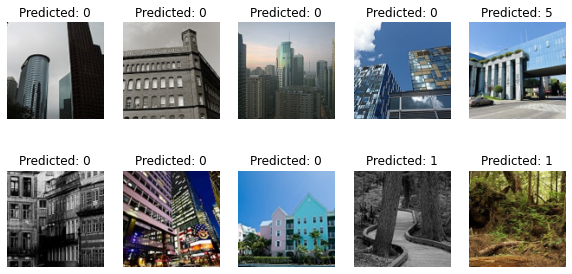

In [32]:
 ### Prediction
print(eval_dataset.classes)
# Switch model to evaluation mode
model.eval()
# Get 10 random images from the training set
indices = torch.randint(0, len(eval_dataset), (10,)).tolist()
data = [train_dataset[i] for i in indices]
images = torch.stack([d[0] for d in data])
labels = torch.tensor([d[1] for d in data])

# Predict the labels for the images
with torch.no_grad():
    outputs = model(images)
predicted = torch.argmax(outputs, dim=1)

fig, axs = plt.subplots(2, 5, figsize=(10, 5))
for i in range(2):
    for j in range(5):
        index = i * 5 + j
        axs[i, j].imshow(images[index].permute(1, 2, 0))
        axs[i, j].set_title('Predicted: {}'.format(predicted[index]))
        axs[i, j].axis('off')
plt.show()


### Save the model weights into a separate file

In [49]:
torch.save(model.state_dict(),'model1_weights(LabModel).pth')